<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
#!pip install ydata_profiling

In [109]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from itertools import combinations
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import Ridge

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Каждый запуск даёт одни и те же результаты` Сиды фиксируем для воспроизводимости результатов

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

**Ваш ответ здесь.**

In [3]:
# Пропуски по колонкам
null_counts = df_train.isna().sum()
print(null_counts)

# Число дубликатов строк
n_duplicates = df_train.duplicated().sum()
print("Число дубликатов строк:", n_duplicates)

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64
Число дубликатов строк: 985


In [4]:
profile = ProfileReport(df_train, title="Cars train profiling", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 97.34it/s][A


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Это для проверки, что кол-во дупликатов в дашборде и почитанное в pd сходится. Pandas считает сколько лишних можно удалить, а в дашборде сколько одна строка встречается раз

In [5]:
df = df_train.copy()

profile = ProfileReport(df, explorative=True)

desc = profile.get_description()

n_dup_profile = desc.table["n_duplicates"]
print("ydata-profiling n_duplicates:", n_dup_profile)

n_pandas = df.duplicated().sum()
print("pandas duplicated().sum():", n_pandas)

n_pandas_all = df.duplicated(keep=False).sum()
print("pandas duplicated(keep=False).sum():", n_pandas_all)

n_patterns = df.shape[0] - df.drop_duplicates().shape[0]
print("pandas (уникальных дубликатных паттернов):", n_patterns)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 139.67it/s]


ydata-profiling n_duplicates: 493
pandas duplicated().sum(): 985
pandas duplicated(keep=False).sum(): 1478
pandas (уникальных дубликатных паттернов): 985


In [6]:
profile.to_file("cars_train_profile.html")

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Пропущенных данных не так много - 1005 (1.1%). Дубликатов достаточно много (7.7%), лучше их удалить. Есть явно коррелирующие столбцы, их корреляция объясняется правилами рынка, например - год и цена автомобиля или просто логикой, как год выпуска и пробег. Теперь сделаем тоже самое для test данных

In [7]:
null_counts = df_test.isna().sum()
print(null_counts)

# Число дубликатов строк
n_duplicates = df_test.duplicated().sum()
print("Число дубликатов строк:", n_duplicates)

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64
Число дубликатов строк: 62


In [8]:
profile_1 = ProfileReport(df_test, title="Cars test profiling", explorative=True)
profile_1.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 312.58it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В тестовой выборке меньше пропущенных значений и дубликатов. Но дубликаты всё равно следует удалить. Так же наблюдаются похожие корреляции.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [9]:
# разделим признаки по типам
num_cols = df_train.select_dtypes(include=['number']).columns
cat_cols = df_train.select_dtypes(exclude=['number']).columns

print("Числовые колонки:", list(num_cols))
print("Категориальные колонки:", list(cat_cols))

Числовые колонки: ['year', 'selling_price', 'km_driven', 'seats']
Категориальные колонки: ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque']


В категориальные попали engine, max_power, torque, mileage, хотя они числовые. Это из-за лишних символов в значениях (единицы измерения). Вручную сделаем их числовыми

In [10]:
def clean_numeric_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()

    def extract_first_number(s: pd.Series) -> pd.Series:
        return pd.to_numeric(
            s.astype(str).str.extract(r'([\d\.]+)', expand=False),
            errors='coerce'
        )

    if 'mileage' in df.columns:
        df['mileage_num'] = extract_first_number(df['mileage'])

    if 'max_power' in df.columns:
        df['max_power_num'] = extract_first_number(df['max_power'])

    if 'engine' in df.columns:
        df['engine_cc'] = extract_first_number(df['engine'])

    if 'torque' in df.columns:
        s = df['torque'].astype(str)

        torque_nm = s.str.extract(r'([\d\.]+)\s*Nm', expand=False)
        torque_rpm = s.str.extract(r'@?\s*([\d\.]+)\s*rpm', expand=False)

        df['torque_nm'] = pd.to_numeric(torque_nm, errors='coerce')
        df['torque_rpm'] = pd.to_numeric(torque_rpm, errors='coerce')

    return df

In [11]:
df_train = clean_numeric_features(df_train)
df_test  = clean_numeric_features(df_test)

In [12]:
df_train = df_train.drop(columns=['mileage', 'max_power', 'engine', 'torque'])
df_test  = df_test.drop(columns=['mileage', 'max_power', 'engine', 'torque'])

In [13]:
num_cols = df_test.select_dtypes(include=['number']).columns
cat_cols = df_test.select_dtypes(exclude=['number']).columns

print("Числовые колонки:", list(num_cols))
print("Категориальные колонки:", list(cat_cols))

Числовые колонки: ['year', 'selling_price', 'km_driven', 'seats', 'mileage_num', 'max_power_num', 'engine_cc', 'torque_nm', 'torque_rpm']
Категориальные колонки: ['name', 'fuel', 'seller_type', 'transmission', 'owner']


Удалим старые столбцы и оставим новые только с числами.

In [14]:
num_cols = df_train.select_dtypes(include=['number']).columns
cat_cols = df_train.select_dtypes(exclude=['number']).columns

print("Числовые колонки:", list(num_cols))
print("Категориальные колонки:", list(cat_cols))

Числовые колонки: ['year', 'selling_price', 'km_driven', 'seats', 'mileage_num', 'max_power_num', 'engine_cc', 'torque_nm', 'torque_rpm']
Категориальные колонки: ['name', 'fuel', 'seller_type', 'transmission', 'owner']


In [15]:
train_mean   = df_train[num_cols].mean()
train_median = df_train[num_cols].median()

test_mean    = df_test[num_cols].mean()
test_median  = df_test[num_cols].median()

compare_stats = pd.DataFrame({
    "train_mean": train_mean,
    "train_median": train_median,
    "test_mean": test_mean,
    "test_median": test_median
})

compare_stats["mean_diff"]   = compare_stats["test_mean"] - compare_stats["train_mean"]
compare_stats["median_diff"] = compare_stats["test_median"] - compare_stats["train_median"]

compare_stats


,train_mean,train_median,test_mean,test_median,mean_diff,median_diff
year,2013.818403,2015.0,2013.681000,2014.00,-0.137403,-1.00
selling_price,639515.197171,450000.0,617901.042000,434999.00,-21614.155171,-15001.00
km_driven,69584.615517,60000.0,71393.341000,61500.00,1808.725483,1500.00
seats,5.419008,5.0,5.410805,5.00,-0.008203,0.00
mileage_num,19.426604,19.3,19.338206,19.33,-0.088398,0.03
max_power_num,91.500023,82.0,91.015627,83.10,-0.484396,1.10
engine_cc,1458.327203,1248.0,1458.882773,1248.00,0.555570,0.00
torque_nm,178.155951,171.0,175.432175,160.00,-2.723776,-11.00
torque_rpm,3060.693113,3000.0,3055.389428,3000.00,-5.303684,0.00


Значительная разница в значениях между train и test наблюдается только в цене продажи . Так же можно заметить, что среднее и медиана в многих столбцах внутри каждой выборки довольно близки

In [16]:
train_num_desc = df_train[num_cols].describe()
test_num_desc  = df_test[num_cols].describe()

train_num_desc

,year,selling_price,km_driven,seats,mileage_num,max_power_num,engine_cc,torque_nm,torque_rpm
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000,6797.000000,6802.000000,6797.000000,6123.000000,6403.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008,19.426604,91.500023,1458.327203,178.155951,3060.693113
std,4.053095,8.089419e+05,5.772400e+04,0.965767,4.045692,35.821622,501.183890,92.531506,941.451239
min,1983.000000,2.999900e+04,1.000000e+00,2.000000,0.000000,0.000000,624.000000,51.000000,0.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000,16.800000,68.050000,1197.000000,110.000000,2250.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000,19.300000,82.000000,1248.000000,171.000000,3000.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000,22.320000,102.000000,1582.000000,205.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000,42.000000,400.000000,3604.000000,789.000000,5300.000000


In [17]:
test_num_desc

,year,selling_price,km_driven,seats,mileage_num,max_power_num,engine_cc,torque_nm,torque_rpm
count,1000.000000,1.000000e+03,1000.000000,981.000000,981.000000,981.000000,981.000000,892.000000,927.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805,19.338206,91.015627,1458.882773,175.432175,3055.389428
std,4.012149,7.585539e+05,48486.218662,0.919985,3.989872,35.207383,526.228560,91.832516,936.024248
min,1995.000000,3.100000e+04,1303.000000,4.000000,0.000000,34.200000,624.000000,48.000000,0.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000,16.500000,69.000000,1197.000000,110.000000,2400.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000,19.330000,83.100000,1248.000000,160.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000,22.320000,102.000000,1582.000000,205.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000,32.260000,280.000000,3604.000000,620.000000,5200.000000


Внутри обоих наборов данных признаки selling_price и km_driven имеют выраженную правую асимметрию (mean > median) — присутствуют дорогие автомобили и машины с очень большим пробегом. Признак seats распределён почти симметрично, а новые числовые признаки (mileage_num, max_power_num, engine_cc, torque_nm) в целом выглядят реалистично, но содержат выбросы и пропуски.
Распределения всех числовых признаков в train и test очень похожи: различия в средних и медианах минимальны. Это значит, что разбиение на обучающую и тестовую выборки не привело к заметному сдвигу распределений , и модель, обученная на train, должна адекватно работать на test при условии корректной обработки выбросов и пропусков.


In [18]:
train_cat_desc = df_train[cat_cols].describe()
test_cat_desc  = df_test[cat_cols].describe()

train_cat_desc

,name,fuel,seller_type,transmission,owner
count,6999,6999,6999,6999,6999
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,116,3793,5826,6095,4587


In [19]:
test_cat_desc

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


Name : названия очень разнообразные, доля топ-модели маленькая, сильная разреженность признака, как категорию в лоб в модель его использовать не очень удобно.
fuel : и там и там топ - дизель. Доля примерно одинаковая
seller_type : топ и там и там 0 individual, доли близки
transmission : Manual в обеих выборках - топ. Доли близки.
owner : топ - автомобили с 1 владельцем . Доли близки

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [20]:
target_col = "selling_price"

feature_cols = [c for c in df_train.columns if c != target_col]

# маска: есть ли в трейне дубликаты по признакам
dup_mask = df_train.duplicated(subset=feature_cols, keep=False)

# сами дубли (по признакам)
dup_rows = df_train[dup_mask].sort_values(feature_cols)

print("Число объектов с одинаковым признаковым описанием:", dup_mask.sum())
dup_rows.head()

Число объектов с одинаковым признаковым описанием: 1799


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,mileage_num,max_power_num,engine_cc,torque_nm,torque_rpm
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,5.0,15.73,174.33,1968.0,380.0,2500.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,5.0,15.73,174.33,1968.0,380.0,2500.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,5.0,13.22,241.40,2967.0,580.0,3250.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,5.0,13.22,241.40,2967.0,580.0,3250.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,5.0,17.01,188.00,1968.0,NaN,3000.0


In [21]:
df_train = df_train.drop_duplicates(subset=feature_cols, keep="first")

In [22]:
df_train = df_train.reset_index(drop=True)
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,mileage_num,max_power_num,engine_cc,torque_nm,torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,5.0,23.40,74.00,1248.0,190.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5.0,21.14,103.52,1498.0,250.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,5.0,23.00,90.00,1396.0,NaN,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,5.0,16.10,88.20,1298.0,NaN,NaN
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,5.0,20.14,81.86,1197.0,NaN,4000.0


Дубликаты удалены и индексация обновлена. Теперь попробуем найти "скрытые" дубли. Они могут быть из-за разнового написания названия авто. Уберем из названия все знаки препинания и пробелы.

In [23]:
def clean_name_column(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df["name_clean"] = (
        df["name"]
        .astype(str)
        .str.lower()                      # в нижний регистр
        .str.replace(r"[^0-9a-zA-Zа-яА-Я]+", "", regex=True)  # всё, что не буква/цифра, выкидываем
    )
    return df

df_train = clean_name_column(df_train)
df_train[["name", "name_clean"]].head(10)

,name,name_clean
0,Maruti Swift Dzire VDI,marutiswiftdzirevdi
1,Skoda Rapid 1.5 TDI Ambition,skodarapid15tdiambition
2,Hyundai i20 Sportz Diesel,hyundaii20sportzdiesel
3,Maruti Swift VXI BSIII,marutiswiftvxibsiii
4,Hyundai Xcent 1.2 VTVT E Plus,hyundaixcent12vtvteplus
5,Maruti Wagon R LXI DUO BSIII,marutiwagonrlxiduobsiii
6,Maruti 800 DX BSII,maruti800dxbsii
7,Toyota Etios VXD,toyotaetiosvxd
8,Ford Figo Diesel Celebration Edition,fordfigodieselcelebrationedition
9,Renault Duster 110PS Diesel RxL,renaultduster110psdieselrxl


In [24]:
target_col = "selling_price"

# все столбцы, кроме таргета
base_feature_cols = [c for c in df_train.columns if c != target_col]

# в списке признаков используем name_clean вместо name
feature_cols = [
    ("name_clean" if c == "name" else c)
    for c in base_feature_cols
]

dup_mask = df_train.duplicated(subset=feature_cols, keep=False)
dup_rows = df_train[dup_mask].sort_values(feature_cols)

print("Число строк дублей (с очищенным name):", dup_mask.sum())
dup_rows.head(20)

Число строк дублей (с очищенным name): 0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,mileage_num,max_power_num,engine_cc,torque_nm,torque_rpm,name_clean


Дублей с отчищенным именем не найдено. Дубли ещё могли бы быть, если бы до этого engine и т.д. не были преобразованы в числовые

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

Сделал это раньше чем увидел задание) Так что просто переименуем

In [25]:
rename_map = {
    "mileage_num": "mileage",
    "engine_cc": "engine",
    "max_power_num": "max_power",
    "torque_nm": "torque",
    "torque_rpm": "max_torque_rpm",
}

for df in (df_train, df_test):
    df.rename(columns=rename_map, inplace=True)
    float_cols = ["mileage", "engine", "max_power", "torque", "max_torque_rpm"]
    for col in float_cols:
        if col in df.columns:
            df[col] = df[col].astype(float)


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [26]:
target_col = "selling_price"


num_cols = df_train.select_dtypes(include="number").columns.tolist()
if target_col in num_cols:
    num_cols.remove(target_col)

print("Числовые колонки с заполнением:", num_cols)

# медианы считаем только по train
medians = df_train[num_cols].median()

df_train[num_cols] = df_train[num_cols].fillna(medians)
df_test[num_cols]  = df_test[num_cols].fillna(medians)


Числовые колонки с заполнением: ['year', 'km_driven', 'seats', 'mileage', 'max_power', 'engine', 'torque', 'max_torque_rpm']


In [27]:
print("Пропуски в train:\n", df_train[num_cols].isna().sum())
print("Пропуски в test:\n",  df_test[num_cols].isna().sum())

Пропуски в train:
 year              0
km_driven         0
seats             0
mileage           0
max_power         0
engine            0
torque            0
max_torque_rpm    0
dtype: int64
Пропуски в test:
 year              0
km_driven         0
seats             0
mileage           0
max_power         0
engine            0
torque            0
max_torque_rpm    0
dtype: int64


Распределения многих числовых признаков у нас асимметричные и с выбросами, среднее сильно тянется в сторону выбросов: одна машина за 10 млн испортит «типичную цену». Поэтому медиана , а не среднее.
Считаем медиану по train и её же вставляем в test, так как при реальном прогнозе данных из test у нас нет, и расчёт медианы c учётом test по факту является косвенной подставновкой прогнозируемых данных в обучение.

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [28]:
for df in (df_train, df_test):
    df["engine"] = df["engine"].astype(int)
    df["seats"]  = df["seats"].astype(int)
df_train.dtypes.to_frame("dtype")


,dtype
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
seats,int64
mileage,float64


seats принимает непрерывного диапазона значений нет, есть несколько фиксированных вариантов: 2, 4, 5, 6, 7, 8, 9, 14 и т.п., каждое значение - это фактически класс автомобиля по вместимости (маленький хэтчбек, седан, минивэн и т.д.) - это дискретная велечина. Но величина все же влияет на цену - в основном рост цены при росте кол-ва мест (за исключением возможно перехода от 4 к 2 местам), поэтому его можно использовать как числовой

`Your answer here`

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [29]:
train_num_desc = df_train[num_cols].describe()
test_num_desc  = df_test[num_cols].describe()

train_num_desc

,year,km_driven,seats,mileage,max_power,engine,torque,max_torque_rpm
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,7.395224e+04,5.426712,19.430841,87.906371,1429.448973,172.331656,3022.612671
std,4.095622,6.007114e+04,0.982344,3.985973,31.640418,485.662834,81.326421,883.638721
min,1983.000000,1.000000e+00,2.000000,0.000000,0.000000,624.000000,51.000000,0.000000
25%,2011.000000,3.900000e+04,5.000000,16.950000,68.000000,1197.000000,113.000000,2400.000000
50%,2014.000000,7.000000e+04,5.000000,19.370000,81.860000,1248.000000,170.000000,3000.000000
75%,2017.000000,1.000000e+05,5.000000,22.300000,99.000000,1498.000000,200.000000,3750.000000
max,2020.000000,2.360457e+06,14.000000,42.000000,400.000000,3604.000000,789.000000,5300.000000


In [30]:
test_num_desc

,year,km_driven,seats,mileage,max_power,engine,torque,max_torque_rpm
count,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,71393.341000,5.403000,19.33881,90.841670,1454.87600,174.845500,3051.346000
std,4.012149,48486.218662,0.912921,3.95175,34.893389,521.99574,86.743058,901.291779
min,1995.000000,1303.000000,4.000000,0.00000,34.200000,624.00000,48.000000,0.000000
25%,2011.000000,37000.000000,5.000000,16.55000,69.000000,1197.00000,111.950000,2500.000000
50%,2014.000000,61500.000000,5.000000,19.37000,82.425000,1248.00000,170.000000,3000.000000
75%,2017.000000,100000.000000,5.000000,22.30000,102.000000,1582.00000,200.000000,4000.000000
max,2020.000000,375000.000000,9.000000,32.26000,280.000000,3604.00000,620.000000,5200.000000


In [31]:
train_cat_desc = df_train[cat_cols].describe()
test_cat_desc  = df_test[cat_cols].describe()

train_cat_desc

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [32]:
test_cat_desc

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


После заполнения пропусков и удаления дублей практически ничего не поменялось. В общем случаем это могло произойти, но нам повезло и в нашем датасете этого не произошло. Пройзойти это может при большом кол-ве пропусков, или эти пропуcки были бы не "случайными"

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

In [33]:
target_col = "selling_price"

num_cols = ["year", "km_driven", "seats",
            "mileage", "max_power", "engine",
            "torque", "max_torque_rpm"]

cat_cols = ["fuel", "seller_type", "transmission", "owner"]

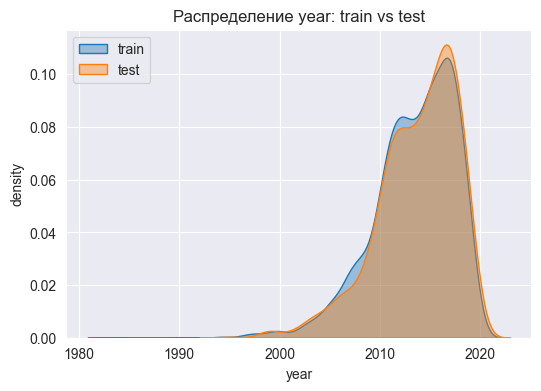

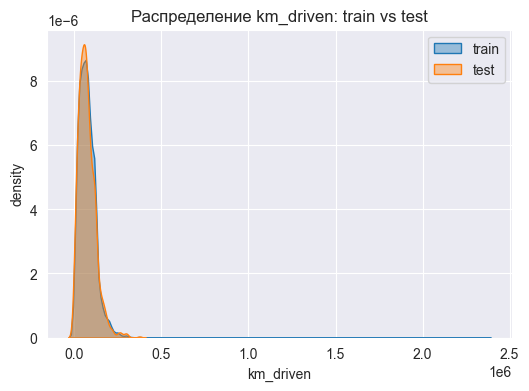

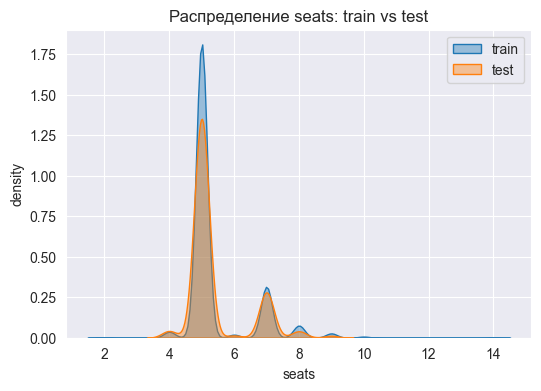

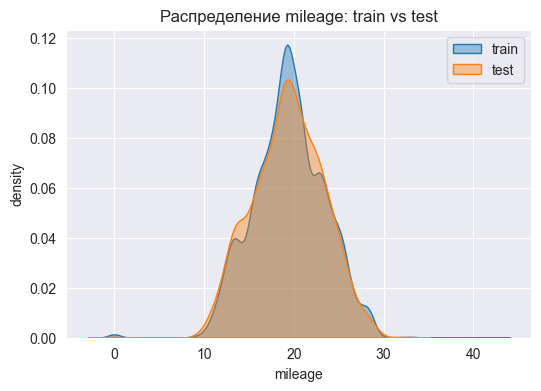

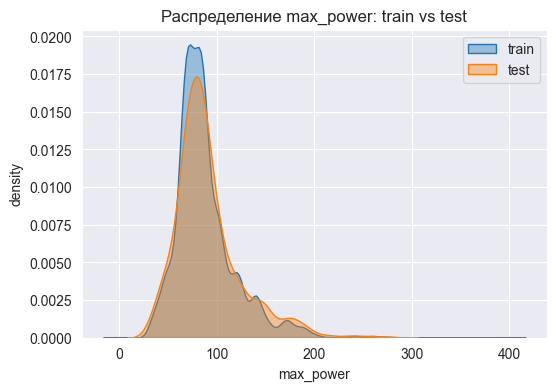

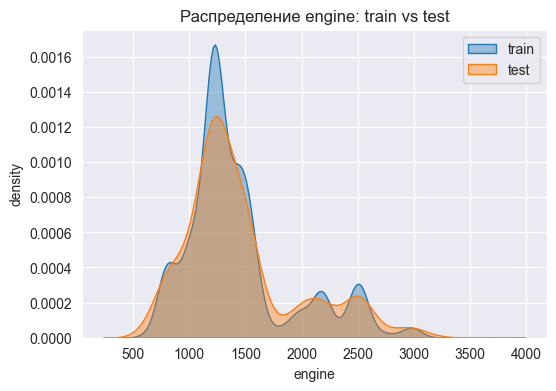

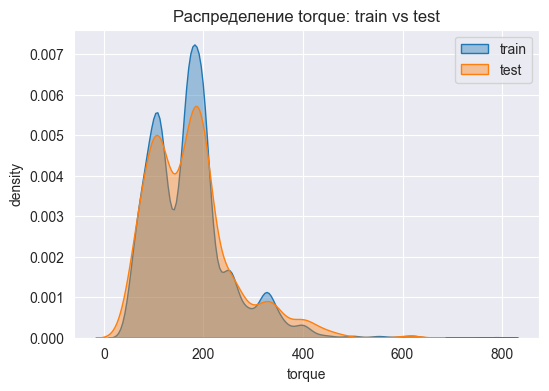

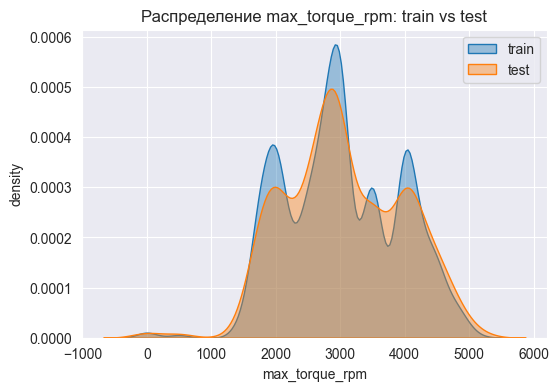

In [34]:
#числовые
for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df_train[col], label="train", fill=True, alpha=0.4)
    sns.kdeplot(df_test[col],  label="test",  fill=True, alpha=0.4)
    plt.title(f"Распределение {col}: train vs test")
    plt.xlabel(col)
    plt.ylabel("density")
    plt.legend()
    plt.show()

Распределение года выпуска в train и test практически идентично: основная масса автомобилей 2010–2020 г, явного сдвига между выборками нет.

Пробег имеет сильно правостороннее распределение с длинным хвостом (есть машины с экстремально большим пробегом). Формы распределений в train и test совпадают.

Признак seats дискретный: доминируют 5-местные автомобили, реже встречаются 7-местные и другие. Распределения в train и test совпадают.

Mileage распределён примерно нормально вокруг 18–21, формы кривых train и test практически совпадают, заметного смещения нет.

Максимальная мощность имеет перекошенное вправо распределение: большинство машин в диапазоне 70–100 л.с., есть редкие мощные автомобили. Train и test по этому признаку распределены схоже.

Объём двигателя имеет мультимодальное распределение (видны типичные классы объёма: ~1.2–1.6, ~2.0–2.5 л). Train и test демонстрируют одинаковую структуру.

Крутящий момент распределён неравномерно, с несколькими пиками и правым хвостом; формы распределений train и test очень похожи.

Обороты максимального момента имеют выраженные моды около 2000, 3000 и 4000 об/мин, что соответствует типичным режимам двигателей. Распределения в train и test совпадают.



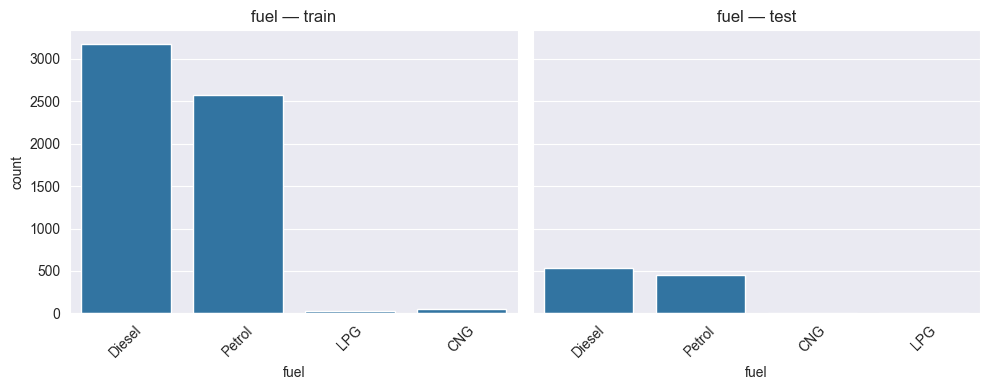

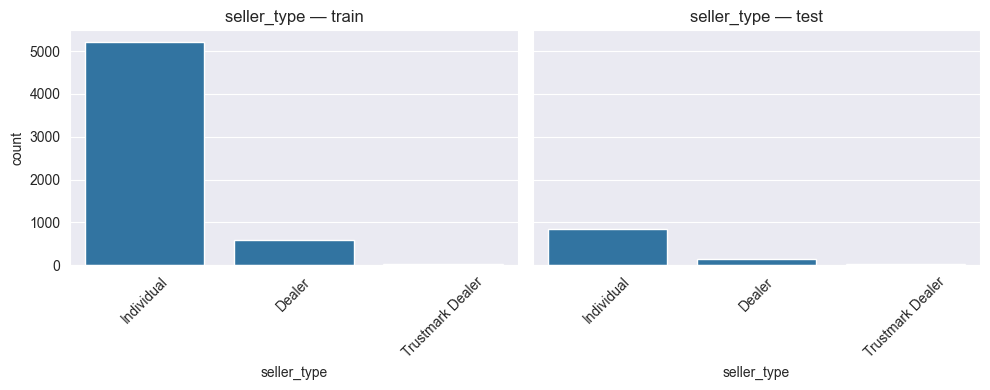

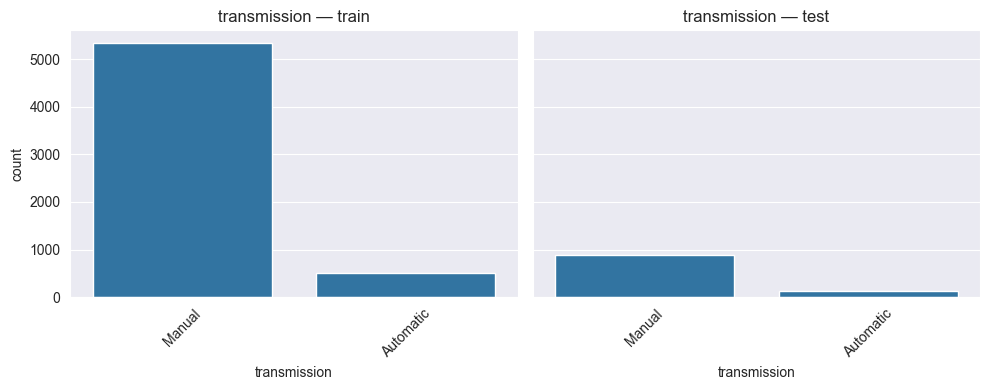

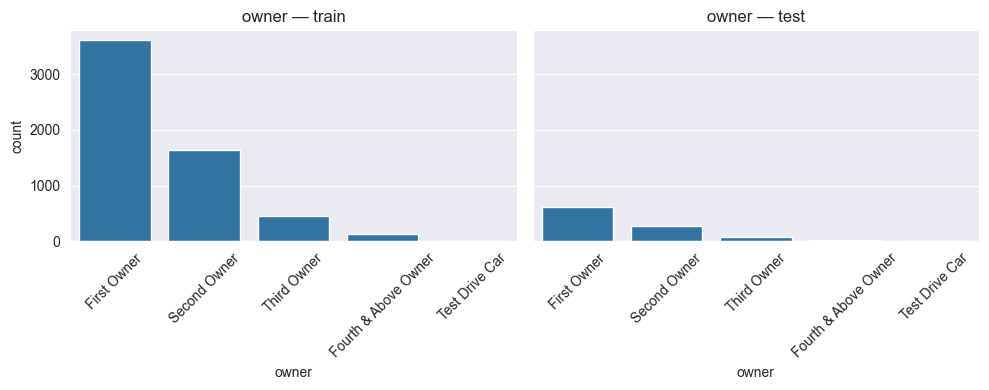

In [35]:
#категориальные
for col in cat_cols:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

    sns.countplot(x=col, data=df_train, ax=axes[0])
    axes[0].set_title(f"{col} — train")
    axes[0].tick_params(axis='x', rotation=45)

    sns.countplot(x=col, data=df_test, ax=axes[1])
    axes[1].set_title(f"{col} — test")
    axes[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

В обеих выборках основную часть составляют дизельные и бензиновые автомобили, доля дизеля немного выше. Редкие типы топлива (CNG, LPG) представлены слабо, при этом структура категорий в train и test практически совпадает.

Большинство машин продаются частными лицами (категория Individual), на долю дилеров приходится меньшая часть объявлений. В train и test соотношение типов продавцов почти одинаковое, что говорит об отсутствии сдвига по этому признаку.

Тип коробки передач в данных сильно перекошен в сторону механики: автомобили с автоматической коробкой составляют меньшинство. Распределения в train и test совпадают.

Основная масса машин — от первого владельца, существенно меньше автомобилей со вторым и последующими владельцами. Распределения по числу владельцев в train и test повторяют друг друга.

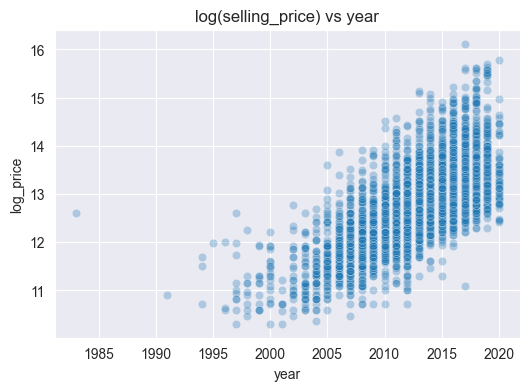

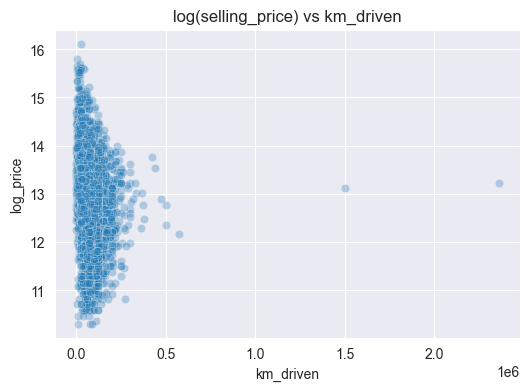

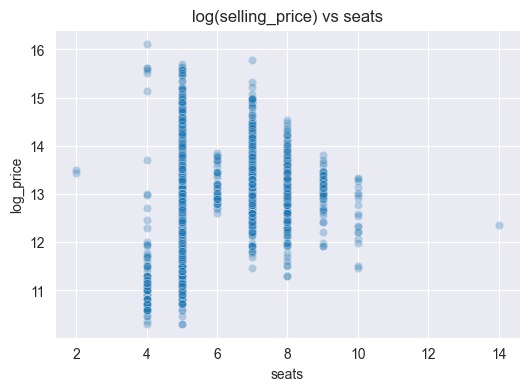

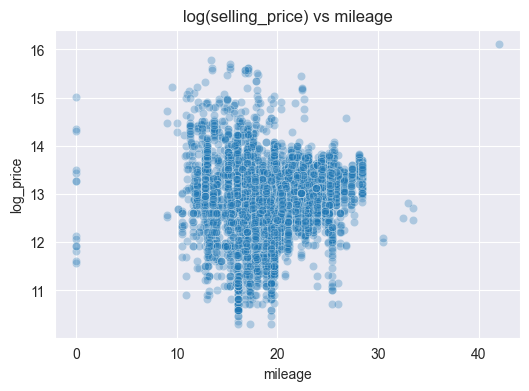

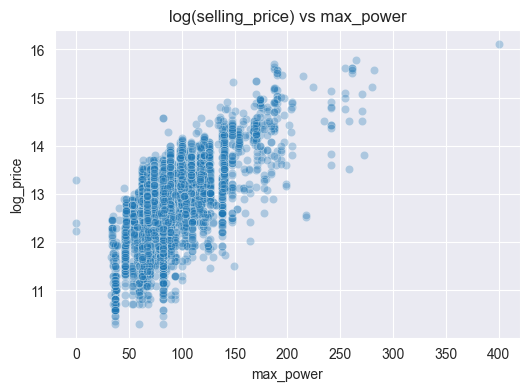

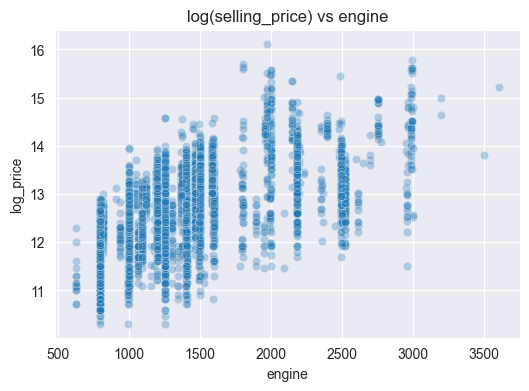

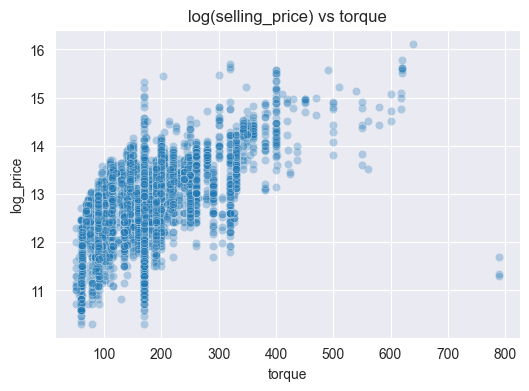

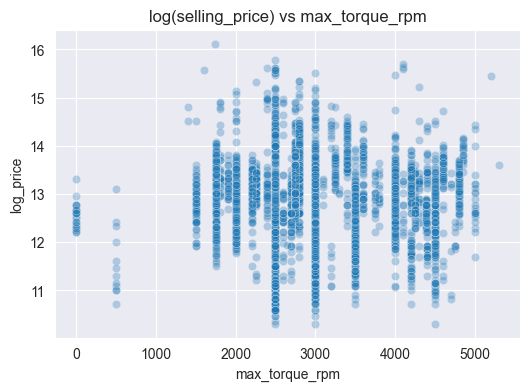

In [36]:
df_train["log_price"] = np.log1p(df_train["selling_price"])

for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=col, y="log_price", data=df_train, alpha=0.3)
    plt.title(f"log(selling_price) vs {col}")
    plt.show()

Взяли log от цены что бы убрать жёсткие хвосты. По графикам на log(selling_price) видно, что наиболее сильную связь с целевой переменной демонстрируют признаки year, max_power, engine и torque — при их росте логарифм цены систематически увеличивается. Пробег km_driven имеет слабую отрицательную зависимость с ценой, а seats, mileage и max_torque_rpm влияют на стоимость гораздо менее явно.

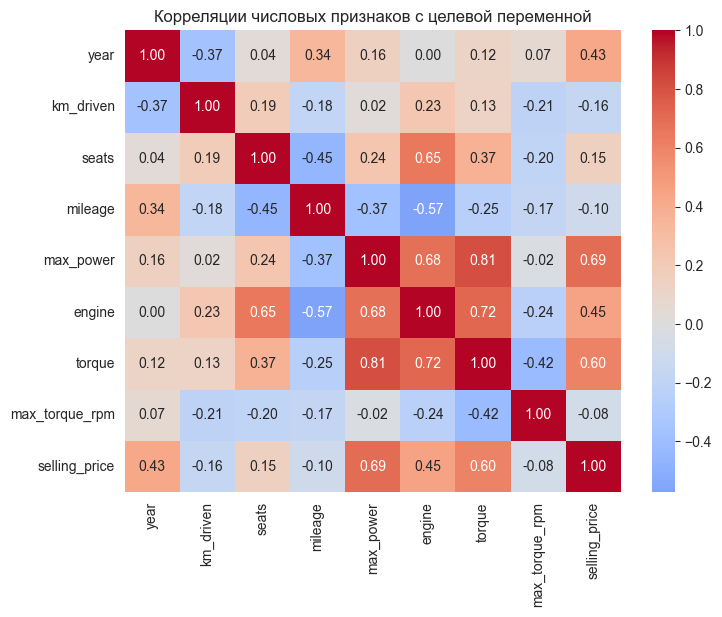

In [37]:
corr_cols = num_cols + [target_col]
corr = df_train[corr_cols].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Корреляции числовых признаков с целевой переменной")
plt.show()

Взяли только train.

Наибольшую по модулю корреляцию с целевой переменной имеет признак max_power (0.69), далее идут torque (0.60), engine (0.45) и year (0.43). Пробег (km_driven) и расход (mileage) связаны с ценой значительно слабее и отрицательно.

max_power, engine и torque очень тесно коррелируют друг с другом (коэффициенты 0.7–0.8), а seats заметно связан с engine. При построении линейных моделей это может приводить к нестабильности оценок, поэтому часть этих признаков потенциально избыточна.

Экономичность (mileage) отрицательно связана с мощностью, объёмом и моментом, а пробег (km_driven) отрицательно коррелирует с годом выпуска и ценой, что соответствует реальности.

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

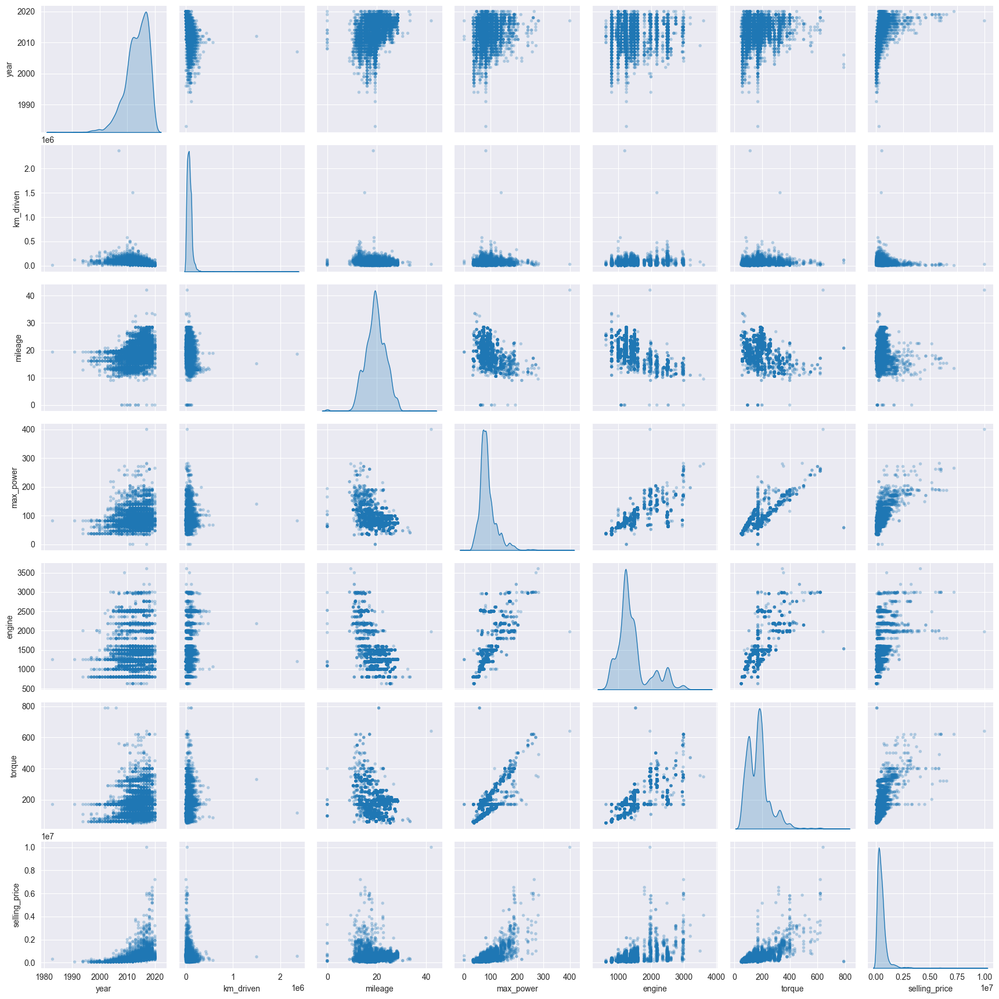

In [38]:
pair_cols = [
    "year",
    "km_driven",
    "mileage",
    "max_power",
    "engine",
    "torque",
    "selling_price",
]

sns.pairplot(
    df_train[pair_cols],
    diag_kind="kde",
    plot_kws={"alpha": 0.3, "s": 15, "edgecolor": "none"},
)
plt.show()

Новых выводов здесь нет - всё описано в предыдущем пункте .

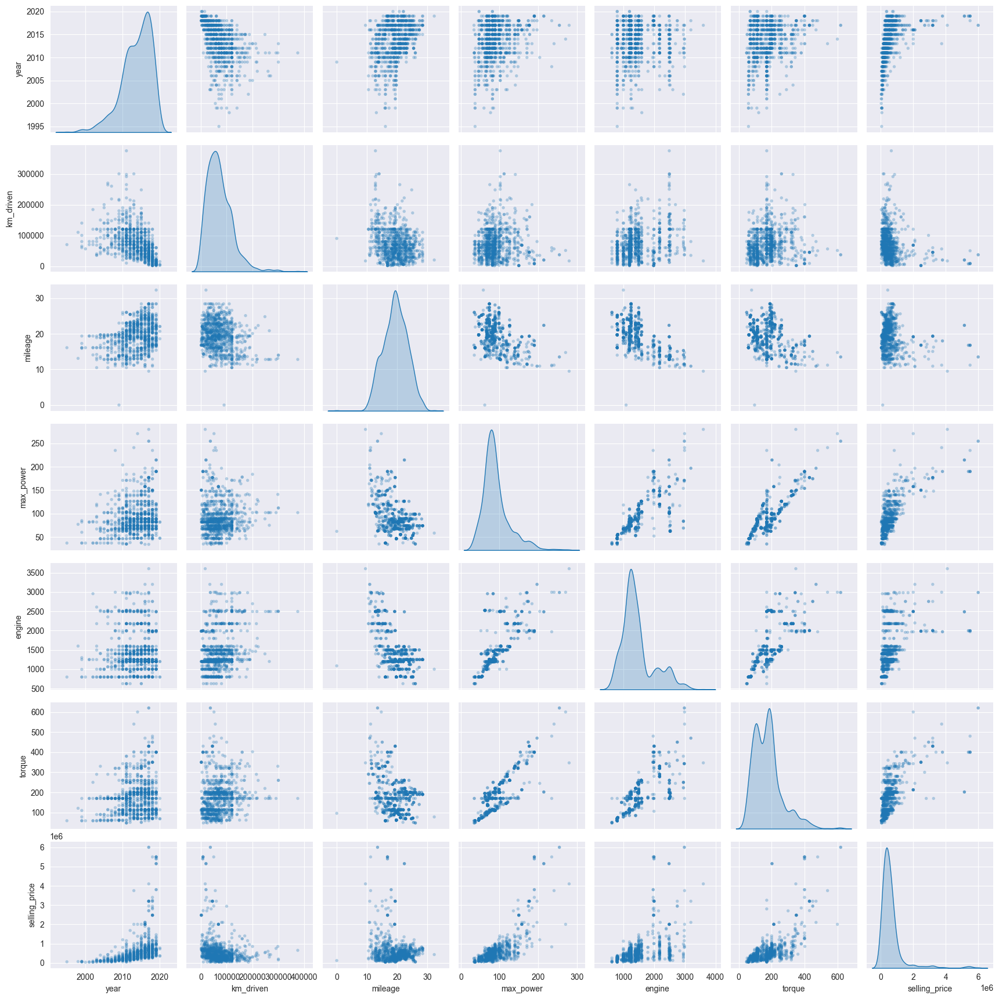

In [39]:
sns.pairplot(
    df_test[pair_cols],
    diag_kind="kde",
    plot_kws={"alpha": 0.3, "s": 15, "edgecolor": "none"},
)
plt.show()


pairplot по тестовым данным показывает те же распределения и те же попарные зависимости признаков (включая selling_price), что и по train. Существенных сдвигов не наблюдается: train и test выглядят как две выборки из одной и той же генеральной совокупности. Это означает, что разбиение данных на обучающую и тестовую части не исказило их структуру.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [40]:
# Числовые признаки + таргет
num_cols = [
    "year",
    "km_driven",
    "seats",
    "mileage",
    "max_power",
    "engine",
    "torque",
    "max_torque_rpm",
    "selling_price",
]

#Матрица корреляций Пирсона по train
corr = df_train[num_cols].corr(method="pearson")
corr

,year,km_driven,seats,mileage,max_power,engine,torque,max_torque_rpm,selling_price
year,1.000000,-0.368966,0.041178,0.341334,0.156858,0.002819,0.116573,0.068883,0.427279
km_driven,-0.368966,1.000000,0.192328,-0.182086,0.024588,0.229766,0.128126,-0.211033,-0.164828
seats,0.041178,0.192328,1.000000,-0.451059,0.244112,0.652172,0.368012,-0.202979,0.149953
mileage,0.341334,-0.182086,-0.451059,1.000000,-0.373390,-0.572893,-0.251863,-0.170995,-0.104769
max_power,0.156858,0.024588,0.244112,-0.373390,1.000000,0.681117,0.812405,-0.021564,0.692814
engine,0.002819,0.229766,0.652172,-0.572893,0.681117,1.000000,0.721621,-0.239034,0.447672
torque,0.116573,0.128126,0.368012,-0.251863,0.812405,0.721621,1.000000,-0.421119,0.604804
max_torque_rpm,0.068883,-0.211033,-0.202979,-0.170995,-0.021564,-0.239034,-0.421119,1.000000,-0.078896
selling_price,0.427279,-0.164828,0.149953,-0.104769,0.692814,0.447672,0.604804,-0.078896,1.000000


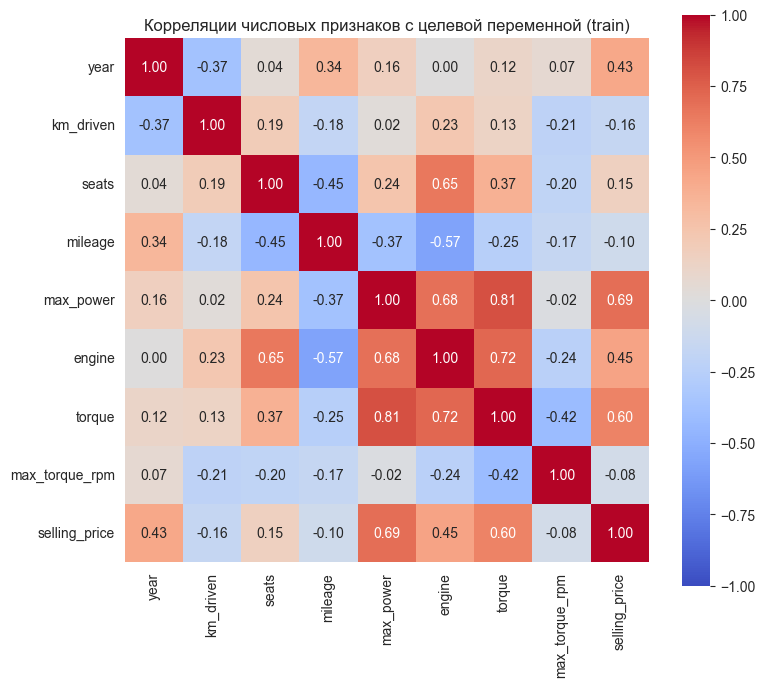

In [41]:
plt.figure(figsize=(8, 7))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    square=True,
)
plt.title("Корреляции числовых признаков с целевой переменной (train)")
plt.tight_layout()
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

- Это было сделано выше и подробные выводы так же находятся там. Здесь кратко:

1) year и engine
2) max_power и torque
3) в среднем старые машины проезжают больше километров ( но нельзя утверждать как последнюю истину)
4) pd.corr поддерживает методы: "pearson" - корреляция Пирсона, "kendall" - корреляция Кендалла, "spearman" - корреляция Спирмена. У нас везде Пирсон


### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [42]:
# посчитаем спирмена вручную
# нужно посчитать ранги для каждой переменной и взять корреляцию пирсона между рангами
def rank_1d(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x)
    order = np.argsort(x)
    ranks = np.empty_like(order, dtype=float)
    ranks[order] = np.arange(len(x), dtype=float)

    # обработка одинаковых значений
    uniques, inv, counts = np.unique(x, return_inverse=True, return_counts=True)
    cum_counts = np.cumsum(counts)
    starts = cum_counts - counts
    avg_ranks = (starts + cum_counts - 1) / 2.0
    ranks = avg_ranks[inv]
    return ranks

# 2. Корреляция Спирмена для двух векторов
def spearman_corr(x: np.ndarray, y: np.ndarray) -> float:
    rx = rank_1d(x)
    ry = rank_1d(y)
    return np.corrcoef(rx, ry)[0, 1]

# Матрица корреляций Спирмена
def spearman_corr_df(df: pd.DataFrame) -> pd.DataFrame:
    cols = df.columns
    n = len(cols)
    mat = np.empty((n, n), dtype=float)

    for i, ci in enumerate(cols):
        for j, cj in enumerate(cols):
            mat[i, j] = spearman_corr(df[ci].values, df[cj].values)

    return pd.DataFrame(mat, index=cols, columns=cols)


num_cols = [
    "year",
    "km_driven",
    "seats",
    "mileage",
    "max_power",
    "engine",
    "torque",
    "max_torque_rpm",
    "selling_price",
]

spearman_manual = spearman_corr_df(df_train[num_cols])
spearman_manual


,year,km_driven,seats,mileage,max_power,engine,torque,max_torque_rpm,selling_price
year,1.000000,-0.569659,0.048291,0.346132,0.165798,-0.038056,0.112736,0.075674,0.707123
km_driven,-0.569659,1.000000,0.195317,-0.198466,0.040919,0.304504,0.237411,-0.311506,-0.295665
seats,0.048291,0.195317,1.000000,-0.435458,0.304857,0.527716,0.431781,-0.199423,0.317605
mileage,0.346132,-0.198466,-0.435458,1.000000,-0.308824,-0.429871,-0.146915,-0.173366,0.026186
max_power,0.165798,0.040919,0.304857,-0.308824,1.000000,0.713113,0.734069,-0.050393,0.612258
engine,-0.038056,0.304504,0.527716,-0.429871,0.713113,1.000000,0.807431,-0.363130,0.463577
torque,0.112736,0.237411,0.431781,-0.146915,0.734069,0.807431,1.000000,-0.561108,0.571482
max_torque_rpm,0.075674,-0.311506,-0.199423,-0.173366,-0.050393,-0.363130,-0.561108,1.000000,-0.137081
selling_price,0.707123,-0.295665,0.317605,0.026186,0.612258,0.463577,0.571482,-0.137081,1.000000


In [43]:
spearman_pd = df_train[num_cols].corr(method="spearman")

# максимум абсолютной разницы
max_diff = (spearman_manual - spearman_pd).abs().max().max()
print("Максимальное отличие:", max_diff)


Максимальное отличие: 2.220446049250313e-16


Разница с библиотечной реализацией минимальна.

Знаки всех коэффициентов совпадают.

Пары с сильной связью те же самые:
max_power - torque,
engine - torque,
engine - max_power,
engine - seats,
selling_price с max_power, torque, engine, year.

По модулю коэффициенты Спирмена часто немного выше, особенно для пар с явно монотонной, но не строго линейной зависимостью (например, year-selling_price, max_power-torque). Это ожидаемо, поскольку Спирмен оценивает именно монотонность и менее чувствителен к выбросам. Для почти линейных зависимостей (max_power-engine, selling_price-max_power) значения Пирсона и Спирмена близки.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

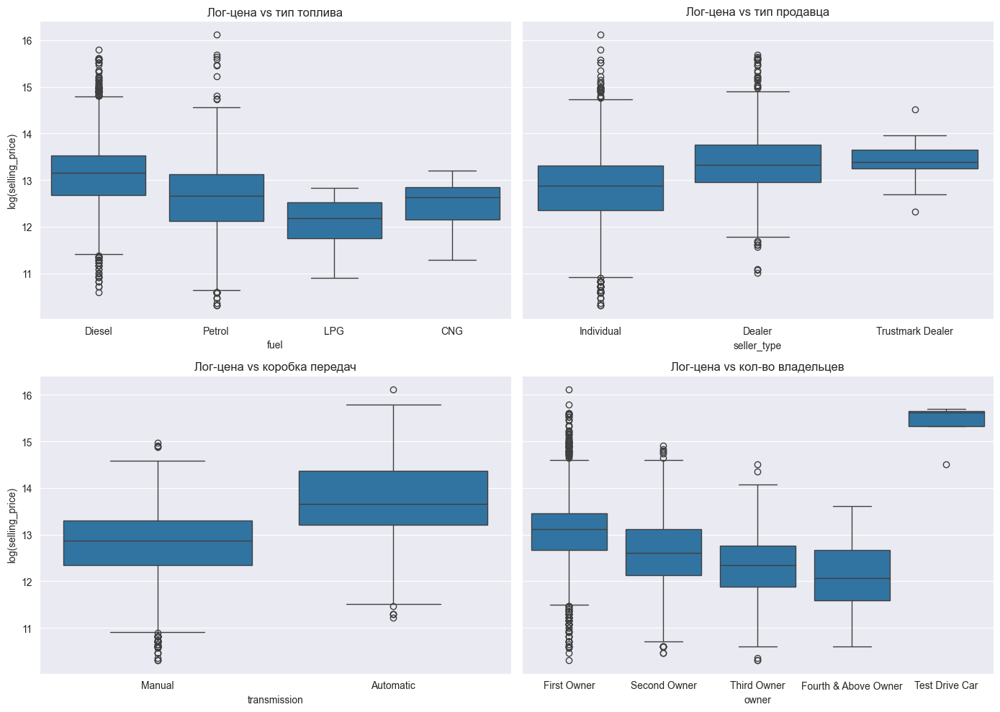

In [44]:
# посмотрим зависимость от категориальных признаков
df_train["log_price"] = np.log(df_train["selling_price"])

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)
axes = axes.ravel()

cat_features = ["fuel", "seller_type", "transmission", "owner"]
titles = [
    "Лог-цена vs тип топлива",
    "Лог-цена vs тип продавца",
    "Лог-цена vs коробка передач",
    "Лог-цена vs кол-во владельцев",
]

for ax, col, title in zip(axes, cat_features, titles):
    sns.boxplot(
        data=df_train,
        x=col,
        y="log_price",
        ax=ax,
    )
    ax.set_title(title)
    ax.set_xlabel(col)
    ax.set_ylabel("log(selling_price)")

plt.tight_layout()
plt.show()

тип топлива влияет на стоимость, но эффект умеренный: дизель и бензин формируют основной (и более дорогой) рынок, газовые машины - ближе к бюджетному сегменту.

покупка у дилера в среднем дороже, что логично - более новые авто, гарантия и наценка за сервис. При этом есть выбросы у частных продавцов, которые выше чем цены на машины у диллеров - это могут быть редкие автомобиля снятые с производства

машины с автоматической коробкой дороже, что тоже логично. Но так же наблюдаеются выбросы у механики, которые выше автоматической. Это могут быть раритетные автомобили и спорткары.

чем больше владельцев было у автомобиля, тем ниже его стоимость. Test-drive - всегда новые автомобили, поэтому такая высокая цена.

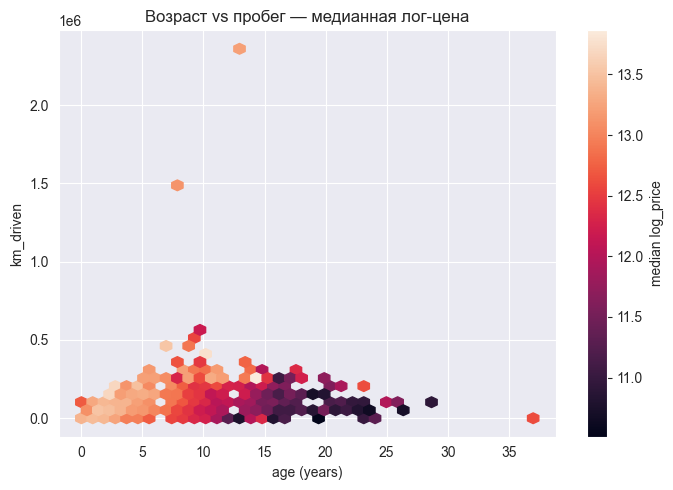

In [45]:
#посмотрим, а как возраст и пробег одновременно влияют?


df_train["age"] = max(df_train["year"]) - df_train["year"]

plt.figure(figsize=(7, 5))
hb = plt.hexbin(
    df_train["age"],
    df_train["km_driven"],
    C=df_train["log_price"],
    gridsize=40,
    reduce_C_function=np.median,
)
plt.xlabel("age (years)")
plt.ylabel("km_driven")
cb = plt.colorbar(hb)
cb.set_label("median log_price")
plt.title("Возраст vs пробег — медианная лог-цена")
plt.tight_layout()
plt.show()

In [46]:
df_train.sort_values("km_driven", ascending=False).head(5)[
    ["name", "year", "km_driven", "selling_price", "fuel", "transmission", "owner"]
]

,name,year,km_driven,selling_price,fuel,transmission,owner
2680,Hyundai i20 Asta 1.2,2007,2360457,550000,Petrol,Manual,Second Owner
1397,Mahindra XUV500 W6 2WD,2012,1500000,500000,Diesel,Manual,First Owner
2700,Maruti Wagon R LXI Minor,2010,577414,194000,Petrol,Manual,Second Owner
2780,Maruti Wagon R VXI BS IV,2011,500000,229999,Petrol,Manual,Second Owner
4844,Toyota Innova 2.5 EV Diesel PS 7 Seater BSIII,2011,500000,350000,Diesel,Manual,Second Owner


В общем получены ожидаемые результаты - наиболее дорогие автомобили - это молодые машины с небольшим пробегом (нижний левый угол). При фиксированном возрасте рост пробега приводит к снижению медианной стоимости, а при фиксированном пробеге увеличение возраста также ведёт к падению цены. Таким образом, возраст и пробег совместно и в одном направлении (через износ) влияют на стоимость автомобиля, причём эффект особенно заметен для машин старше ~10–12 лет и с пробегом выше 200-300 тыс. км.

При этом есть 2 явных выброса сверху. Была гипотеза, что это коммерчесикй транспорт из-за высокой цены и огромного пробега, но это обычные автомобили эконом класса - скорее всего лишний ноль в данных

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [47]:
real_cols = [
    "year", # год выпуска
    "km_driven", # пробег
    "seats", # кол-во мест
    "mileage", # расход топлива
    "max_power", # мощность
    "engine", # объем двигателя
    "torque", #крутящий момент
    "max_torque_rpm", # обороты, на которых достигается макс крутящий момент
    "selling_price",  # целевая
]

#Копии датафреймов только с вещественными признаками
train_real = df_train[real_cols].copy()
test_real  = df_test[real_cols].copy()

y_train = train_real["selling_price"]
X_train = train_real.drop(columns=["selling_price"])

y_test = test_real["selling_price"]
X_test = test_real.drop(columns=["selling_price"])

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [50]:
#Обучаем модель
linreg = LinearRegression()
linreg.fit(X_train, y_train)

#Предсказания
y_pred_train = linreg.predict(X_train)
y_pred_test  = linreg.predict(X_test)

#Метрики R^2 и MSE
r2_train = r2_score(y_train, y_pred_train)
r2_test  = r2_score(y_test, y_pred_test)

mse_train = MSE(y_train, y_pred_train)
mse_test  = MSE(y_test, y_pred_test)

print(f"R^2 train: {r2_train:.4f}")
print(f"R^2 test : {r2_test:.4f}")
print(f"MSE train: {mse_train:.2f}")
print(f"MSE test : {mse_test:.2f}")

R^2 train: 0.6014
R^2 test : 0.6007
MSE train: 114247116098.45
MSE test : 229553047300.66


Простая линейная регрессия по числовым признакам даёт R^2 = 0.6 на обеих выборках - это умеренно хорошее качество, переобучения нет. Но MSE - огромное. Порядок MSE в выборках одинаковый, но разница в 2 раза. Базово следует логарифмировать цену, добавить категориальные признаки и попробовать регуляризацию.

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [51]:
def r2_manual(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    # среднее истинных значений
    y_mean = y_true.mean()

    # сумма квадратов ошибок модели (SSE / RSS)
    sse = np.sum((y_true - y_pred) ** 2)

    # полная сумма квадратов относительно среднего (SST)
    sst = np.sum((y_true - y_mean) ** 2)

    # коэффициент детерминации
    return 1 - sse / sst

Формула коэффициента детерминации \(R^2\):

$$
R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}
           {\sum_{i=1}^{n} (y_i - \bar{y})^2}
$$

где

$$
\bar{y} = \frac{1}{n}\sum_{i=1}^{n} y_i.
$$

- $y_i$ - фактическое значение таргета для объекта $i$;
- $\hat{y}_i$ - предсказание модели для объекта $i$;
- $\bar{y} = \dfrac{1}{n}\sum_{i=1}^{n} y_i$ - среднее по всем истинным значениям;
- $\sum_{i=1}^{n} (y_i - \hat{y}_i)^2$ - **SSE / RSS** (sum of squared errors / residual sum of squares) - сколько ошибки оставила модель;
- $\sum_{i=1}^{n} (y_i - \bar{y})^2$ - **SST** (total sum of squares) - полная «разбросанность» данных относительно среднего.


In [52]:
r2_train_sklearn = r2_score(y_train, y_pred_train)
r2_train_manual  = r2_manual(y_train, y_pred_train)

print(r2_train_sklearn, r2_train_manual)

0.6014241613562492 0.6014241613562492


Полное совпадение

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [54]:
def adjusted_r2_score(y_true, y_pred, n_features):
    n = len(y_true)
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - n_features - 1)

Скорректированный коэффициент детерминации (adjusted \(R^2\)):

$$
R_{\text{adj}}^{2}
= 1 - (1 - R^{2}) \cdot \frac{n - 1}{n - p - 1},
$$

где
$R^{2}$ - обычный коэффициент детерминации,
$n$ - число наблюдений,
$p$ - число признаков (объясняющих переменных).

Используют когда сравнивают модели с разным числом признаков.
Обычный почти всегда растёт, если добавить больше фичей (даже бесполезных).
Adjusted штрафует за лишние признаки: если новая фича не улучшает модель достаточно сильно.
Поэтому его используют в задачах множественной регрессии, при отборе признаков и сравнении моделей разной сложности.


In [55]:
p = X_train.shape[1]

adj_r2_train = adjusted_r2_score(y_train, y_pred_train, p)
adj_r2_test  = adjusted_r2_score(y_test,  y_pred_test,  p)

print("Adjusted R^2 train:", adj_r2_train)
print("Adjusted R^2 test :", adj_r2_test)

Adjusted R^2 train: 0.600877324328441
Adjusted R^2 test : 0.5974344918499368


У нас практически равен обычному R^2, значит набор признаков нормальный

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [57]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)


X_train_scaled = pd.DataFrame(X_train_scaled,
                              columns=X_train.columns,
                              index=X_train.index)

X_test_scaled = pd.DataFrame(X_test_scaled,
                             columns=X_test.columns,
                             index=X_test.index)

In [59]:
# модель на сырых признаках
lin_raw = LinearRegression()
lin_raw.fit(X_train, y_train)

y_train_pred_raw = lin_raw.predict(X_train)
y_test_pred_raw  = lin_raw.predict(X_test)

r2_train_raw  = r2_score(y_train, y_train_pred_raw)
r2_test_raw   = r2_score(y_test,  y_test_pred_raw)
mse_train_raw = MSE(y_train, y_train_pred_raw)
mse_test_raw  = MSE(y_test,  y_test_pred_raw)

print("Без стандартизации")
print(f"R^2 train: {r2_train_raw:.4f}")
print(f"R^2 test : {r2_test_raw:.4f}")
print(f"MSE train: {mse_train_raw:.2f}")
print(f"MSE test : {mse_test_raw:.2f}")

# модель на стандартизованных признаках
lin_scaled = LinearRegression()
lin_scaled.fit(X_train_scaled, y_train)

y_train_pred_scaled = lin_scaled.predict(X_train_scaled)
y_test_pred_scaled  = lin_scaled.predict(X_test_scaled)

r2_train_scaled  = r2_score(y_train, y_train_pred_scaled)
r2_test_scaled   = r2_score(y_test,  y_test_pred_scaled)
mse_train_scaled = MSE(y_train, y_train_pred_scaled)
mse_test_scaled  = MSE(y_test,  y_test_pred_scaled)

print("\nСо стандартизацией")
print(f"R^2 train: {r2_train_scaled:.4f}")
print(f"R^2 test : {r2_test_scaled:.4f}")
print(f"MSE train: {mse_train_scaled:.2f}")
print(f"MSE test : {mse_test_scaled:.2f}")

Без стандартизации
R^2 train: 0.6014
R^2 test : 0.6007
MSE train: 114247116098.45
MSE test : 229553047300.66

Со стандартизацией
R^2 train: 0.6014
R^2 test : 0.6007
MSE train: 114247116098.45
MSE test : 229553047300.65


Cтандартизовали все вещественные признаки с помощью `StandardScaler`:
каждый признак переводится к нулевому среднему и единичному стандартному
отклонению. Параметры стандартизации (mean и std) были посчитаны только
по тренировочным данным (`fit` на `X_train`), а затем одинаково
применены к train и test (`transform`), чтобы избежать утечки информации
из тестовой выборки. Для обычной линейной регрессии это почти не меняет
качество (R^2 и MSE остаются теми же)

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [60]:
coefs = pd.Series(lin_scaled.coef_, index=X_train.columns)

coefs_sorted = coefs.reindex(coefs.abs().sort_values(ascending=False).index)

display(coefs_sorted)

most_important_feature = coefs_sorted.abs().idxmax()
print("Самый информативный признак (по |β|):", most_important_feature)

max_power         300128.840374
year              165356.030145
km_driven         -49118.432946
torque             44630.645064
max_torque_rpm    -41889.134897
seats             -32074.013282
engine             19988.858283
mileage            -8350.118600
dtype: float64

Самый информативный признак (по |β|): max_power


Наиболее вляиющий признак - мощность. Это логично, как правило, чем выше класс автомобиля, тем больше у него мощности.

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [62]:
lasso = Lasso(alpha=1.0)
lasso.fit(X_train_scaled, y_train)

y_train_pred_lasso = lasso.predict(X_train_scaled)
y_test_pred_lasso  = lasso.predict(X_test_scaled)

r2_train_lasso = r2_score(y_train, y_train_pred_lasso)
r2_test_lasso  = r2_score(y_test,  y_test_pred_lasso)

mse_train_lasso = MSE(y_train, y_train_pred_lasso)
mse_test_lasso  = MSE(y_test,  y_test_pred_lasso)

print(f"Lasso R^2 train: {r2_train_lasso:.4f}")
print(f"Lasso R^2 test : {r2_test_lasso:.4f}")
print(f"Lasso MSE train: {mse_train_lasso:.2f}")
print(f"Lasso MSE test : {mse_test_lasso:.2f}")

coefs_lasso = pd.Series(lasso.coef_, index=X_train.columns)

print("\nКоэффициенты Lasso:")
display(coefs_lasso)

# Какие веса реально занулились?
zero_coefs = coefs_lasso[coefs_lasso.abs() < 1e-6]
print("\nКоличество занулённых коэффициентов:", len(zero_coefs))
print("Занулённые признаки:")
display(zero_coefs)

Lasso R^2 train: 0.6014
Lasso R^2 test : 0.6007
Lasso MSE train: 114247116112.27
Lasso MSE test : 229553760977.11

Коэффициенты Lasso:


year              165353.783832
km_driven         -49117.491215
seats             -32070.028336
mileage            -8346.910729
max_power         300129.543691
engine             19986.520586
torque             44631.265072
max_torque_rpm    -41886.706564
dtype: float64


Количество занулённых коэффициентов: 0
Занулённые признаки:


Series([], dtype: float64)

Ничего не занулилось, а теперь попробуем поигаться с альфа

In [66]:
alphas = np.logspace(-3, 3, 13)
results = []

for a in alphas:
    lasso = Lasso(alpha=a, random_state=42, max_iter=10000)
    lasso.fit(X_train_scaled, y_train)
    n_zero = (lasso.coef_ == 0).sum()
    results.append((a, n_zero))

for a, n_zero in results:
    print(f"alpha={a:.4f}, нулевых коэффициентов: {n_zero} из {len(X_train_scaled.columns)}")

alpha=0.0010, нулевых коэффициентов: 0 из 8
alpha=0.0032, нулевых коэффициентов: 0 из 8
alpha=0.0100, нулевых коэффициентов: 0 из 8
alpha=0.0316, нулевых коэффициентов: 0 из 8
alpha=0.1000, нулевых коэффициентов: 0 из 8
alpha=0.3162, нулевых коэффициентов: 0 из 8
alpha=1.0000, нулевых коэффициентов: 0 из 8
alpha=3.1623, нулевых коэффициентов: 0 из 8
alpha=10.0000, нулевых коэффициентов: 0 из 8
alpha=31.6228, нулевых коэффициентов: 0 из 8
alpha=100.0000, нулевых коэффициентов: 0 из 8
alpha=316.2278, нулевых коэффициентов: 0 из 8
alpha=1000.0000, нулевых коэффициентов: 0 из 8


Даже при таком переборе нулей нет, следует посмотреть на сами признаки


In [67]:
coefs = pd.Series(lasso.coef_, index=X_train_scaled.columns)
print(coefs)
print("min |coef|:", coefs.abs().min())

year              163056.243468
km_driven         -48199.457922
seats             -28161.055685
mileage            -5010.614879
max_power         300718.641620
engine             17896.625990
torque             45264.634324
max_torque_rpm    -39391.910135
dtype: float64
min |coef|: 5010.614879321029


Даже при высоком альфа каждый признак настолько снижает ошибку, что модель предпочитает держать все коэффициенты заметно отличными от нуля, чем выкидывать хоть один целиком. Можно дальше повышать альфа, какой-то признак занулиться, но скорее всего и вырастет ошибка

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [77]:
base_lasso = Lasso(random_state=42, max_iter=10_000)


alphas = np.logspace(-3, 2, 40)
param_grid = {
    "alpha": alphas #alpha — коэффициент L1-регуляризации в Lasso. Чем больше alpha, тем сильнее штрафуются большие |β| и тем агрессивнее модель стремится уменьшать/занулять коэффициенты
}


grid = GridSearchCV(
    estimator=base_lasso,
    param_grid=param_grid,
    cv=10,              # 10 фолдов, в каждом шаге кросс валидации обучаем на 9 кусочках, а 10-ый как валидация.
    scoring="r2",       # по умолчанию для регрессии тоже R^2, но явно лучше указать
    n_jobs=-1,          # использовать все ядра
    refit=True          # после поиска дообучить модель на всём train
)

grid.fit(X_train_scaled, y_train)

print("Лучшие параметры:", grid.best_params_)

best_lasso = grid.best_estimator_

# посмотрим на коэффициенты
coefs = pd.Series(best_lasso.coef_, index=X_train_scaled.columns)
print("\nКоэффициенты лучшей модели:")
print(coefs)

n_zero = (coefs == 0).sum()
print(f"\nНулевых коэффициентов: {n_zero} из {len(coefs)}")

y_train_pred_lasso = best_lasso.predict(X_train_scaled)
y_test_pred_lasso  = best_lasso.predict(X_test_scaled)

# Метрики
r2_train_lasso = r2_score(y_train, y_train_pred_lasso)
r2_test_lasso  = r2_score(y_test,  y_test_pred_lasso)

mse_train_lasso = MSE(y_train, y_train_pred_lasso)
mse_test_lasso  = MSE(y_test,  y_test_pred_lasso)

print(f"R^2 train: {r2_train_lasso:.4f}")
print(f"R^2 test : {r2_test_lasso:.4f}")
print(f"MSE train: {mse_train_lasso:.2f}")
print(f"MSE test : {mse_test_lasso:.2f}")


Лучшие параметры: {'alpha': np.float64(100.0)}

Коэффициенты лучшей модели:
year              165129.055543
km_driven         -49025.589695
seats             -31681.065018
mileage            -8023.713587
max_power         300179.498648
engine             19767.671485
torque             44707.539006
max_torque_rpm    -41637.730714
dtype: float64

Нулевых коэффициентов: 0 из 8
R^2 train: 0.6014
R^2 test : 0.6005
MSE train: 114247254655.21
MSE test : 229625293368.84


Было использовано 400 моделей - 40*10

На train метрики совпадают до четвёртого знака - регуляризация почти не изменила качество.
На test Lasso чуть-чуть хуже: R^2 упал с 0.6007 до 0.6005, MSE слегка вырос. Это микро-разница, фактически в пределах шума кросс-валидации.
Мультиколлинеарность есть, но и переобучения нет.
В итоге регуляризация Lasso нам не помогла.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [80]:
base_enet = ElasticNet(
    random_state=42,
    max_iter=10_000
)

# Сетка гиперпараметров
alphas    = np.logspace(-3, 2, 10)
l1_ratios = np.linspace(0.1, 0.9, 9)

param_grid_enet = {
    "alpha": alphas,
    "l1_ratio": l1_ratios
}

grid_enet = GridSearchCV(
    estimator=base_enet,
    param_grid=param_grid_enet,
    cv=10,
    scoring="r2",
    n_jobs=-1,
    refit=True
)

grid_enet.fit(X_train_scaled, y_train)

best_enet = grid_enet.best_estimator_


print("Лучшие параметры:", grid_enet.best_params_)

# Коэффициенты
coefs_enet = pd.Series(best_enet.coef_, index=X_train_scaled.columns)
print("\nКоэффициенты лучшей модели:")
print(coefs_enet)

n_zero_enet = (coefs_enet == 0).sum()
print(f"\nНулевых коэффициентов: {n_zero_enet} из {len(coefs_enet)}")

# Предсказания
y_train_pred_enet = best_enet.predict(X_train_scaled)
y_test_pred_enet  = best_enet.predict(X_test_scaled)

# Метрики
r2_train_enet = r2_score(y_train, y_train_pred_enet)
r2_test_enet  = r2_score(y_test,  y_test_pred_enet)

mse_train_enet = MSE(y_train, y_train_pred_enet)
mse_test_enet  = MSE(y_test,  y_test_pred_enet)

print(f"\nR^2 train: {r2_train_enet:.4f}")
print(f"R^2 test : {r2_test_enet:.4f}")
print(f"MSE train: {mse_train_enet:.2f}")
print(f"MSE test : {mse_test_enet:.2f}")

Лучшие параметры: {'alpha': np.float64(0.5994842503189409), 'l1_ratio': np.float64(0.7000000000000001)}

Коэффициенты лучшей модели:
year              141728.196922
km_driven         -51575.583521
seats             -30145.650586
mileage              216.597473
max_power         205185.189232
engine             46676.060934
torque            102577.469882
max_torque_rpm     -8635.985467
dtype: float64

Нулевых коэффициентов: 0 из 8

R^2 train: 0.5915
R^2 test : 0.5686
MSE train: 117098906855.51
MSE test : 247980546028.95


Всего 900 моделей.
Регуляризация на 70% L1 и на 30% L2.
Ни один признак не занулился
ElasticNet с подобранными по сетке параметрами (alpha ≈ 0.6, l1_ratio = 0.7) не улучшил качество по сравнению с обычной линейной регрессией и Lasso: и R², и MSE на тесте стали хуже.

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [82]:
def l0_best_subset(X, y, lam):
    """
    Поиск лучшей модели с L0-регуляризацией:
    минимизируем MSE + lam * k, где k - число использованных признаков.

    X, y - np.array
    lam - коэффициент регуляризации λ
    """
    n_features = X.shape[1]

    best_obj = np.inf
    best_subset = tuple()
    best_model = None

    # Включим вариант "без признаков": просто предсказывать среднее
    # (это удобно как базовый уровень)
    y_mean = np.full_like(y, y.mean(), dtype=float)
    mse_mean = MSE(y, y_mean)
    obj_mean = mse_mean + lam * 0
    if obj_mean < best_obj:
        best_obj = obj_mean
        best_subset = tuple()
        best_model = None  # будем трактовать как константную модель

    # Перебираем все непустые подмножества признаков
    for k in range(1, n_features + 1):
        for idx in combinations(range(n_features), k):
            X_sub = X[:, idx]
            model = LinearRegression()
            model.fit(X_sub, y)
            y_pred = model.predict(X_sub)
            mse = MSE(y, y_pred)

            obj = mse + lam * k
            if obj < best_obj:
                best_obj = obj
                best_subset = idx
                best_model = model

    return best_model, best_subset, best_obj


In [87]:
Xtr = X_train_scaled.values
Xte = X_test_scaled.values
ytr = y_train.values
yte = y_test.values

feature_names = X_train_scaled.columns

lambdas = [0,1e6, 5e6, 1e7, 5e7, 1e8, 5e8, 1e9, 5e9, 1e10, 2e10, 5e10, 1e11]

results_l0 = []

for lam in lambdas:
    model, subset, obj = l0_best_subset(Xtr, ytr, lam)
    k = len(subset)

    if k == 0:
        # модель "предсказываем среднее"
        ytr_pred = np.full_like(ytr, ytr.mean(), dtype=float)
        yte_pred = np.full_like(yte, ytr.mean(), dtype=float)
    else:
        Xtr_sub = Xtr[:, subset]
        Xte_sub = Xte[:, subset]
        ytr_pred = model.predict(Xtr_sub)
        yte_pred = model.predict(Xte_sub)

    r2_tr = r2_score(ytr, ytr_pred)
    r2_te = r2_score(yte, yte_pred)
    mse_tr = MSE(ytr, ytr_pred)
    mse_te = MSE(yte, yte_pred)

    used_features = [feature_names[i] for i in subset]

    results_l0.append({
        "lambda": lam,
        "k": k,
        "features": used_features,
        "R2_train": r2_tr,
        "R2_test": r2_te,
        "MSE_train": mse_tr,
        "MSE_test": mse_te,
    })

pd.DataFrame(results_l0)

,lambda,k,features,R2_train,R2_test,MSE_train,MSE_test
0,0.000000e+00,8,"[year, km_driven, seats, mileage, max_power, e...",0.601424,0.600658,1.142471e+11,2.295530e+11
1,1.000000e+06,8,"[year, km_driven, seats, mileage, max_power, e...",0.601424,0.600658,1.142471e+11,2.295530e+11
2,5.000000e+06,8,"[year, km_driven, seats, mileage, max_power, e...",0.601424,0.600658,1.142471e+11,2.295530e+11
3,1.000000e+07,8,"[year, km_driven, seats, mileage, max_power, e...",0.601424,0.600658,1.142471e+11,2.295530e+11
4,5.000000e+07,7,"[year, km_driven, seats, max_power, engine, to...",0.601325,0.600536,1.142755e+11,2.296233e+11
5,1.000000e+08,7,"[year, km_driven, seats, max_power, engine, to...",0.601325,0.600536,1.142755e+11,2.296233e+11
6,5.000000e+08,4,"[year, km_driven, max_power, max_torque_rpm]",0.598825,0.595527,1.149923e+11,2.325027e+11
7,1.000000e+09,4,"[year, km_driven, max_power, max_torque_rpm]",0.598825,0.595527,1.149923e+11,2.325027e+11
8,5.000000e+09,2,"[year, max_power]",0.584061,0.581317,1.192239e+11,2.406712e+11
9,1.000000e+10,2,"[year, max_power]",0.584061,0.581317,1.192239e+11,2.406712e+11


при малых λ поведение как у обычной линейной регрессии (все признаки, максимум качества);

при λ ~ 5·10⁷-10⁸ можно выкинуть один слабый признак без потери качества;

при λ ≥ 5·10⁸ модель становится сильно разреженной (4 и 2 признака), но это уже заметно ухудшает R² и увеличивает MSE.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

в name идёт полно наименование автомобиля. В нём есть бренд, модель и скорее всего у многих модификация модели. Самым логичным видется оставить исключительно бренд. При чем редко встречающееся запихать в одну категорию Other

In [90]:
# склеиваем имена, чтобы одинаково обработать train и test
all_names = pd.concat([df_train['name'], df_test['name']], axis=0)

# Берём марку как первое слово в названии
brands = all_names.str.split().str[0]

# Считаем частоты марок
brand_counts = brands.value_counts()

# Порог частоты: всё, что реже N раз, отправим в "Other"
N = 50
rare_brands = brand_counts[brand_counts < N].index

# Заменяем редкие марки на "Other"
brands_clean = brands.where(~brands.isin(rare_brands), other='Other')

# Записываем обратно в столбец name

df_train['name'] = brands_clean.iloc[:len(df_train)].values
df_test['name']  = brands_clean.iloc[len(df_train):].values


In [97]:
all_names = pd.concat([df_train['name'], df_test['name']], axis=0)
n_brands_total = all_names.nunique()
print("Всего уникальных брендов (включая 'Other'):", n_brands_total)

Всего уникальных брендов (включая 'Other'): 15


Получилось сократить столбец name до 15 уникальных значений - это уже можно использовать как категориальный признак

### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [106]:
cat_cols = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']
drop_cols = ["name_clean", "log_price", "year"]

y_train = df_train['selling_price']
y_test  = df_test['selling_price']

train_no_target = df_train.drop(columns=['selling_price'])
test_no_target  = df_test.drop(columns=['selling_price'])

# Склеиваем, чтобы метод дал одинаковый набор столбцов
all_data = pd.concat(
    [train_no_target, test_no_target],
    keys=['train', 'test']
)

# One-Hot-кодирование категориальных признаков + seats
all_data_ohe = pd.get_dummies(all_data, columns=cat_cols, dtype=int)

# Разделяем обратно на train и test
X_train_ohe = all_data_ohe.xs('train')
X_test_ohe  = all_data_ohe.xs('test')
X_train_ohe.drop(columns=drop_cols)
X_test_ohe.drop(columns=drop_cols)

,km_driven,mileage,max_power,engine,torque,max_torque_rpm,age,name_BMW,name_Chevrolet,name_Datsun,...,owner_Third Owner,seats_2,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,168000,14.00,112.00,2498,260.00,2200.0,NaN,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,25000,21.50,108.50,1497,260.00,2750.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,218463,12.90,130.00,1799,172.00,4300.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,173000,25.10,98.60,1498,200.00,1750.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,70000,16.50,65.00,1172,96.00,3000.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,100000,19.81,68.05,1086,99.04,4500.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
996,50000,18.60,81.83,1197,114.70,4000.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
997,40000,23.00,90.00,1396,170.00,2750.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0
998,25000,20.36,78.90,1197,111.80,4000.0,NaN,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [107]:
X_train_ohe.columns

Index(['year', 'km_driven', 'mileage', 'max_power', 'engine', 'torque',
       'max_torque_rpm', 'name_clean', 'log_price', 'age', 'name_BMW',
       'name_Chevrolet', 'name_Datsun', 'name_Ford', 'name_Honda',
       'name_Hyundai', 'name_Mahindra', 'name_Maruti', 'name_Nissan',
       'name_Other', 'name_Renault', 'name_Skoda', 'name_Tata', 'name_Toyota',
       'name_Volkswagen', 'fuel_CNG', 'fuel_Diesel', 'fuel_LPG', 'fuel_Petrol',
       'seller_type_Dealer', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Automatic',
       'transmission_Manual', 'owner_First Owner',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner', 'seats_2', 'seats_4',
       'seats_5', 'seats_6', 'seats_7', 'seats_8', 'seats_9', 'seats_10',
       'seats_14'],
      dtype='object')

Все столбцы успешно преобразованы

### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

1) Фитим кодировщик только на train. Гарантируем одинаковый набор столбцов на train и test (Если на test встречаются новые категории, их нужно либо игнорировать,либо заранее собрать в категорию "Other") . Следим за размерностью, для признаков с огромным числом категорий (типа name) OHE сделает огромную размерность

2) Почему мы удаляем один столбец?
- Допустим, признак fuel имеет 4 категории: Diesel, Petrol, CNG, LPG.
- Если сделать OHE в лоб, получим 4 индикатора, Но между ними есть линейная связь
- Это линейная зависимость признаков  в линейной регрессии
- матрица X^T * X становится вырожденной

3) Пусть есть 3 категории A, B и C
- после one-hot осталось B и C
- Если мы удалим столбец B, то все объекты категории B будут иметь тот же паттерн признаков, что и A
- То есть по факту мы объеденим категории, в общем случае так делать нельзя, только если мы уверен, что статиcтически это действительно так

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [111]:
base_ridge = Ridge(random_state=42)

alphas = np.logspace(-3, 3, 20)

param_grid_ridge = {
    "alpha": alphas
}

grid_ridge = GridSearchCV(
    estimator=base_ridge,
    param_grid=param_grid_ridge,
    cv=10,
    scoring="r2",
    n_jobs=-1,
    refit=True
)

grid_ridge.fit(X_train_scaled, y_train)

print("Лучшие параметры:", grid_ridge.best_params_)

best_ridge = grid_ridge.best_estimator_

y_train_pred_ridge = best_ridge.predict(X_train_scaled)
y_test_pred_ridge  = best_ridge.predict(X_test_scaled)

r2_train_ridge = r2_score(y_train, y_train_pred_ridge)
r2_test_ridge  = r2_score(y_test,  y_test_pred_ridge)

mse_train_ridge = MSE(y_train, y_train_pred_ridge)
mse_test_ridge  = MSE(y_test,  y_test_pred_ridge)

print(f"R^2 train: {r2_train_ridge:.4f}")
print(f"R^2 test : {r2_test_ridge:.4f}")
print(f"MSE train: {mse_train_ridge:.2f}")
print(f"MSE test : {mse_test_ridge:.2f}")

Лучшие параметры: {'alpha': np.float64(1000.0)}
R^2 train: 0.5921
R^2 test : 0.5700
MSE train: 116925436572.63
MSE test : 247166344235.94


При подборе параметра для Ridge-регрессии качество не улучшилось, а немного ухудшилось по сравнению с обычной линейной моделью

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [114]:
# 1. новые признаки
for df_ in (df_train, df_test):
    # возраст автомобиля
    CURRENT_YEAR = 2025
    df_["age"] = CURRENT_YEAR - df_["year"]

    # пробег в год (защита от деления на ноль)
    df_["km_per_year"] = df_["km_driven"] / df_["age"].clip(lower=1)

    # логарифм пробега
    df_["log_km_driven"] = np.log1p(df_["km_driven"])

    # мощность / объём
    df_["power_per_litre"] = df_["max_power"] / df_["engine"]

    # крутящий момент / объём
    df_["torque_per_litre"] = df_["torque"] / df_["engine"]

# 2. Целевая и подготовка к OHE

cat_cols = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']
drop_cols = ["name_clean", "log_price", "year"]

for df_ in (df_train, df_test):
    df_["log_price"] = np.log1p(df_["selling_price"])

y_train = df_train['selling_price']
y_test = df_test['selling_price']
y_train_log = df_train['log_price']
y_test_log  = df_test['log_price']

train_no_target = df_train.drop(columns=['selling_price'])
test_no_target  = df_test.drop(columns=['selling_price'])

all_data = pd.concat(
    [train_no_target, test_no_target],
    keys=['train', 'test']
)

# 3. One-Hot-кодирование

all_data_ohe = pd.get_dummies(all_data, columns=cat_cols, dtype=int)

X_train_ohe = all_data_ohe.xs('train')
X_test_ohe  = all_data_ohe.xs('test')

X_train_ohe = X_train_ohe.drop(columns=drop_cols)
X_test_ohe  = X_test_ohe.drop(columns=drop_cols)

# 4. Стандартизация

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_ohe)
X_test_scaled  = scaler.transform(X_test_ohe)

# чтобы было удобно по колонкам смотреть коэффициенты:
X_train_scaled = pd.DataFrame(X_train_scaled,
                              columns=X_train_ohe.columns,
                              index=X_train_ohe.index)
X_test_scaled  = pd.DataFrame(X_test_scaled,
                              columns=X_test_ohe.columns,
                              index=X_test_ohe.index)

# 5. Линейная регрессия по цене

lin = LinearRegression()
lin.fit(X_train_scaled, y_train)

y_train_pred = lin.predict(X_train_scaled)
y_test_pred  = lin.predict(X_test_scaled)

r2_train = r2_score(y_train, y_train_pred)
r2_test  = r2_score(y_test,  y_test_pred)
mse_train = MSE(y_train, y_train_pred)
mse_test  = MSE(y_test,  y_test_pred)

print("Линейная регрессия: исходная цена ")
print(f"R^2 train: {r2_train:.4f}")
print(f"R^2 test : {r2_test:.4f}")
print(f"MSE train: {mse_train:.2f}")
print(f"MSE test : {mse_test:.2f}")

# 6. Линейная регрессия по лог-цене

lin_log = LinearRegression()
lin_log.fit(X_train_scaled, y_train_log)

# предсказания в лог-шкале
y_train_pred_log = lin_log.predict(X_train_scaled)
y_test_pred_log  = lin_log.predict(X_test_scaled)

# R^2 в лог-пространстве
r2_train_log = r2_score(y_train_log, y_train_pred_log)
r2_test_log  = r2_score(y_test_log,  y_test_pred_log)

# переводим обратно в рубли
y_train_pred_log_back = np.expm1(y_train_pred_log)
y_test_pred_log_back  = np.expm1(y_test_pred_log)

mse_train_log_model = MSE(y_train, y_train_pred_log_back)
mse_test_log_model  = MSE(y_test,  y_test_pred_log_back)

print("\nЛинейная регрессия: таргет = log(price) ")
print(f"R^2 (log) train: {r2_train_log:.4f}")
print(f"R^2 (log) test : {r2_test_log:.4f}")
print(f"MSE train (в рублях): {mse_train_log_model:.2f}")
print(f"MSE test  (в рублях): {mse_test_log_model:.2f}")

Линейная регрессия: исходная цена 
R^2 train: 0.7517
R^2 test : 0.7312
MSE train: 71163138655.30
MSE test : 154530268388.80

Линейная регрессия: таргет = log(price) 
R^2 (log) train: 0.8841
R^2 (log) test : 0.9131
MSE train (в рублях): 33245833427.96
MSE test  (в рублях): 72309177545.51


- После добавления новых признаков и учёта категориальных переменных через One-Hot кодирование качество модели по исходной цене существенно выросло: R^2 выросло с 0.6 до 0.75. Это показывает, что: категории (name, fuel, seller_type, transmission, owner, seats) содержат важную информацию о цене; инженерные признаки (возраст, пробег в год, удельная мощность и т.д.) действительно помогают лучше описать зависимость.
- Переход к модели с логарифмом цены в качестве таргета (log(price)) дал ещё больший выигрыш: R^2 выросло до 0.9, при обратном преобразовании (exp) MSE на тесте ещё раз сильно уменьшается - до ~7.2·10¹⁰. Данная модель выглядит наиболее предпочтительной
- Выше были пронализированы выбросы - log их частично "сгладил"
- Эх, а хотелось XGBoost сделать(

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [116]:
def business_metric(y_true, y_pred, threshold=0.10):
    """
    Доля объектов, где относительная ошибка |y_pred - y_true| / y_true
    не превышает  10%).
    """
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    mask = y_true != 0
    rel_error = np.abs(y_pred[mask] - y_true[mask]) / y_true[mask]
    return (rel_error <= threshold).mean()

In [117]:
metrics = {}

# 1. Линейная регрессия на стандартизированных вещественных фичах
metrics["lin_scaled"] = {
    "R2_train":  r2_score(y_train, y_train_pred_scaled),
    "R2_test":   r2_score(y_test,  y_test_pred_scaled),
    "MSE_train": MSE(y_train, y_train_pred_scaled),
    "MSE_test":  MSE(y_test,  y_test_pred_scaled),
    "BM_train":  business_metric(y_train, y_train_pred_scaled),
    "BM_test":   business_metric(y_test,  y_test_pred_scaled),
}

# 2. Lasso
metrics["lasso"] = {
    "R2_train":  r2_score(y_train, y_train_pred_lasso),
    "R2_test":   r2_score(y_test,  y_test_pred_lasso),
    "MSE_train": MSE(y_train, y_train_pred_lasso),
    "MSE_test":  MSE(y_test,  y_test_pred_lasso),
    "BM_train":  business_metric(y_train, y_train_pred_lasso),
    "BM_test":   business_metric(y_test,  y_test_pred_lasso),
}

# 3. ElasticNet
metrics["elastic_net"] = {
    "R2_train":  r2_score(y_train, y_train_pred_enet),
    "R2_test":   r2_score(y_test,  y_test_pred_enet),
    "MSE_train": MSE(y_train, y_train_pred_enet),
    "MSE_test":  MSE(y_test,  y_test_pred_enet),
    "BM_train":  business_metric(y_train, y_train_pred_enet),
    "BM_test":   business_metric(y_test,  y_test_pred_enet),
}

# 4. L0-регрессия
metrics["L0_model"] = {
    "R2_train":  r2_score(y_train, ytr_pred),
    "R2_test":   r2_score(y_test,  yte_pred),
    "MSE_train": MSE(y_train, ytr_pred),
    "MSE_test":  MSE(y_test,  yte_pred),
    "BM_train":  business_metric(y_train, ytr_pred),
    "BM_test":   business_metric(y_test,  yte_pred),
}

# 5. Ridge
metrics["ridge"] = {
    "R2_train":  r2_score(y_train, y_train_pred_ridge),
    "R2_test":   r2_score(y_test,  y_test_pred_ridge),
    "MSE_train": MSE(y_train, y_train_pred_ridge),
    "MSE_test":  MSE(y_test,  y_test_pred_ridge),
    "BM_train":  business_metric(y_train, y_train_pred_ridge),
    "BM_test":   business_metric(y_test,  y_test_pred_ridge),
}

# 6. Полная линейная регрессия после OHE
metrics["lin_full_OHE"] = {
    "R2_train":  r2_score(y_train, y_train_pred),
    "R2_test":   r2_score(y_test,  y_test_pred),
    "MSE_train": MSE(y_train, y_train_pred),
    "MSE_test":  MSE(y_test,  y_test_pred),
    "BM_train":  business_metric(y_train, y_train_pred),
    "BM_test":   business_metric(y_test,  y_test_pred),
}

# 7. Модель по log(price)
metrics["lin_log_target"] = {
    "R2_train":  r2_score(y_train, y_train_pred_log_back),
    "R2_test":   r2_score(y_test,  y_test_pred_log_back),
    "MSE_train": MSE(y_train, y_train_pred_log_back),
    "MSE_test":  MSE(y_test,  y_test_pred_log_back),
    "BM_train":  business_metric(y_train, y_train_pred_log_back),
    "BM_test":   business_metric(y_test,  y_test_pred_log_back),
}

metrics_df = (
    pd.DataFrame(metrics)
      .T
      .sort_values("BM_test", ascending=False)
)

display(metrics_df)


,R2_train,R2_test,MSE_train,MSE_test,BM_train,BM_test
lin_log_target,0.884015,0.874207,3.324583e+10,7.230918e+10,0.342808,0.359
lin_full_OHE,0.751732,0.731172,7.116314e+10,1.545303e+11,0.247945,0.276
elastic_net,0.591475,0.568601,1.170989e+11,2.479805e+11,0.228596,0.250
ridge,0.592080,0.570017,1.169254e+11,2.471663e+11,0.228253,0.250
lin_scaled,0.601424,0.600658,1.142471e+11,2.295530e+11,0.215411,0.241
lasso,0.601424,0.600533,1.142473e+11,2.296253e+11,0.216096,0.241
L0_model,0.479991,0.512765,1.490544e+11,2.800764e+11,0.133219,0.154


По бизнес-метрике (доля объектов, для которых ошибка прогноза не превышает 10%) лучшей оказалась модель линейной регрессии с логарифмом цены в качестве таргета (lin_log_target): около 36% машин предсказаны с точностью ±10%. Эта же модель даёт наилучшие значения  R^2 и MSE на тесте, поэтому её можно считать финальной для задачи.

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [118]:
def your_business_metrics(y_true, y_pred, alpha=3.0):
    """
    Взвешенная относительная ошибка:
    - перепрогноз штрафуется как |err|
    - недопрогноз штрафуется как alpha * |err|
    где err = (y_pred - y_true) / y_true.
    Чем меньше значение, тем лучше.
    """
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    eps = 1e-8
    err = (y_pred - y_true) / np.maximum(np.abs(y_true), eps)

    weight = np.where(err < 0, alpha, 1.0)
    loss = weight * np.abs(err)

    return loss.mean()

In [119]:
scores_business2 = {
    "lin_log_target": your_business_metrics(y_test, y_test_pred_log_back),
    "lin_full_OHE":   your_business_metrics(y_test, y_test_pred),
    "elastic_net":    your_business_metrics(y_test, y_test_pred_enet),
    "ridge":          your_business_metrics(y_test, y_test_pred_ridge),
    "lin_scaled":     your_business_metrics(y_test, y_test_pred_scaled),
    "lasso":          your_business_metrics(y_test, y_test_pred_lasso),
    "L0_model":       your_business_metrics(y_test, yte_pred),
}

df_business2 = (
    pd.DataFrame.from_dict(scores_business2, orient="index", columns=["WBM_test"])
      .sort_values("WBM_test")
)

df_business2

,WBM_test
lin_log_target,0.369173
lin_full_OHE,0.915723
elastic_net,1.103810
ridge,1.112338
L0_model,1.118859
lasso,1.328473
lin_scaled,1.329170


В качестве кастомной метрики введена взвешенная абсолютная относительная ошибка, где недопрогноз штрафуется в 3 раза сильнее перепрогноза. По этой метрике на тесте лучшая модель - lin_log_target (линейная регрессия с таргетом log(price)): WBM_test ≈ 0.37. Следом идёт lin_full_OHE (≈ 0.92). Все модели с регуляризацией и L0-модель показывают худшие значения (> 1.1). Таким образом, с точки зрения бизнеса (занижение цены хуже завышения) модель с лог-таргетом остаётся предпочтительной.

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
